In [ ]:
#pip install featurewiz

In [1]:
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
from sklearn import preprocessing
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from  datetime import datetime
from sklearn.linear_model import LinearRegression
import datetime as dt
import seaborn as sns
sns.set()
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import chi2
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
import math 
from sklearn.decomposition import PCA
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import label_binarize
from featurewiz import featurewiz
from sklearn.neural_network import MLPClassifier
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_selection import VarianceThreshold


Imported 0.2.04 version. Select nrows to a small number when running on huge datasets.
output = featurewiz(dataname, target, corr_limit=0.90, verbose=2, sep=',', 
		header=0, test_data='',feature_engg='', category_encoders='',
		dask_xgboost_flag=False, nrows=None, skip_sulov=False)
Create new features via 'feature_engg' flag : ['interactions','groupby','target']



In [17]:
#Datos Balanceados
caractNucleo = pd.read_csv('NUCLEOUNET/caractNucleoUnetCytBal2.csv',sep=';',index_col=0)
caractCito = pd.read_csv('CITOUNET/caractCitoUnetCytBal2.csv',sep=';',index_col=0)

In [18]:

for i,e in enumerate(caractNucleo.columns):
    nombre = 'n'+e
    caractNucleo.rename(columns={e:nombre},inplace=True)
caract = pd.DataFrame()
caract = pd.concat([caractNucleo,caractCito],axis=1)

caract['NC']= caractNucleo['nAREA']/caractCito['AREA']

caract.drop(columns=['nCLASE','nCELULA'],inplace=True)

In [19]:
# tres clases, citología
#normal, lsil,hsil
cytology = []
for ind, ele in enumerate(caract['CLASE']):
    if ele == 1 or ele == 2 or ele == 3:
        #1 NORMAL
         cytology.append(1)
    if ele == 4:
        #2 LSIL
        cytology.append(2)
    if ele == 5 or ele == 6 or ele == 7:
        #3 HSIL
        cytology.append(3)
caract['CYT'] = cytology


# cuatro  clases
#normal, CIN1,CIN2,CIN3
histology = []
for ind, ele in enumerate(caract['CLASE']):
    if ele == 1 or ele == 2 or ele == 3:
        #1 NORMAL
         histology.append(1)
    if ele == 4:
        #2 CIN1
        histology.append(2)
    if ele == 5:
        #3 CIN2
        histology.append(3)
    if ele == 6 or ele == 7:
        #4 CIN3
        histology.append(4)
caract['HIST'] = histology

# DOS CLASES
# dos clases, clasificacion binaria
#normal, lsil,hsil
binario = []
for ind, ele in enumerate(caract['CLASE']):
    if ele == 1 or ele == 2 or ele == 3:
         binario.append(1)
    if ele == 4 or ele == 5 or ele == 6 or ele == 7:
        binario.append(2)
caract['BIN'] = binario

In [ ]:
caract.columns

In [ ]:
#caract = caract[['nAREA','nPERIMETRO','nCIRCULARIDAD','nEJE1','nEJE2','nRELACION','nEXTENSION','nCORRELACION','nDISIMILITUD','nHOMOGENEIDAD','AREA','PERIMETRO','CIRCULARIDAD','EJE1','EJE2','RELACION','EXTENSION','CORRELACION','DISIMILITUD','HOMOGENEIDAD','nCORRELACION2','CORRELACION2','NC','CYT','HIST','BIN','CELULA','CLASE']]

In [ ]:
plt.figure(figsize=(7,3),dpi=98)
sns.countplot(x='CLASE',data=caract)
plt.xlabel('Clases')
plt.ylabel('Observaciones')
plt.title('Cantidad de imágenes por clase')

In [ ]:
plt.figure(figsize=(7,3),dpi=98)
sns.countplot(x='CYT',data=caract)
plt.xlabel('Clases')
plt.ylabel('Observaciones')
plt.title('Cantidad de imágenes por clase')

In [ ]:
caract.columns.drop(['CYT', 'HIST','CELULA','CLASE'])

In [ ]:
lista = caract.columns.drop(['CYT','BIN', 'HIST','CELULA','CLASE'])
for c in lista:
    plt.figure(figsize=(7,3),dpi=98)
    sns.set(style='whitegrid')
    sns.boxplot(x="CYT",y=c,data=caract)
    plt.title('DIAGRAMA DE CAJAS')
    plt.show()

In [ ]:
caract.columns

In [47]:
# CARACTERISTICAS A ESTANDARIZAR
matrizCaract = caract[caract.columns.drop(['BIN','HIST','CYT','CLASE','CELULA'])]
matrizCaract = pd.DataFrame(RobustScaler().fit_transform(matrizCaract),columns=caract.columns.drop(['BIN','HIST','CYT','CLASE','CELULA']))




matrizCaract['HERLEV'] = caract['CLASE']
matrizCaract['BIN'] = caract['BIN']
matrizCaract['CYT'] = caract['CYT']
matrizCaract['HIST'] = caract['HIST']


In [48]:
matrizCaract.describe()

,nAREA,nPERIMETRO,nCIRCULARIDAD,nRADIO,nEJE1,nEJE2,nRELACION,nEXTENSION,nSOLIDEZ,nDIAMEQUI,...,DISIMILITUD3,HOMOGENEIDAD3,ASM3,ENERGIA3,ENTROPIA3,NC,HERLEV,BIN,CYT,HIST
count,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,...,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000
mean,0.060348,-0.103563,-0.268503,-0.109117,-0.043524,-0.120683,0.111589,-0.167148,-0.706796,-0.109117,...,0.142062,0.122698,0.349514,0.210365,-0.080847,0.005015,4.045962,1.682206,2.005909,2.233749
std,0.704625,0.788646,1.109551,0.792593,0.779839,0.822305,0.897551,0.836050,2.710482,0.792593,...,0.810683,0.741212,1.244673,0.855148,0.716486,0.684296,1.694232,0.465772,0.801176,1.127481
min,-0.949334,-1.714227,-7.980522,-1.736137,-1.564877,-1.822959,-2.016812,-3.272908,-25.619977,-1.736137,...,-1.486061,-1.291471,-0.768857,-1.000025,-3.008825,-1.031256,1.000000,1.000000,1.000000,1.000000
25%,-0.451404,-0.511130,-0.575130,-0.517955,-0.490239,-0.523601,-0.452092,-0.584972,-0.658063,-0.517955,...,-0.426676,-0.449339,-0.347988,-0.393464,-0.533882,-0.506895,3.000000,1.000000,1.000000,1.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2.000000,2.000000,2.000000
75%,0.548596,0.488870,0.424870,0.482045,0.509761,0.476399,0.547908,0.415028,0.341937,0.482045,...,0.573324,0.550661,0.652012,0.606536,0.466118,0.493105,5.000000,2.000000,3.000000,3.000000
max,2.231273,1.624482,1.387564,1.564163,1.685719,1.687345,7.715816,1.909879,1.755419,1.564163,...,4.729452,3.028025,16.364408,7.085466,1.363755,1.774159,7.000000,2.000000,3.000000,4.000000


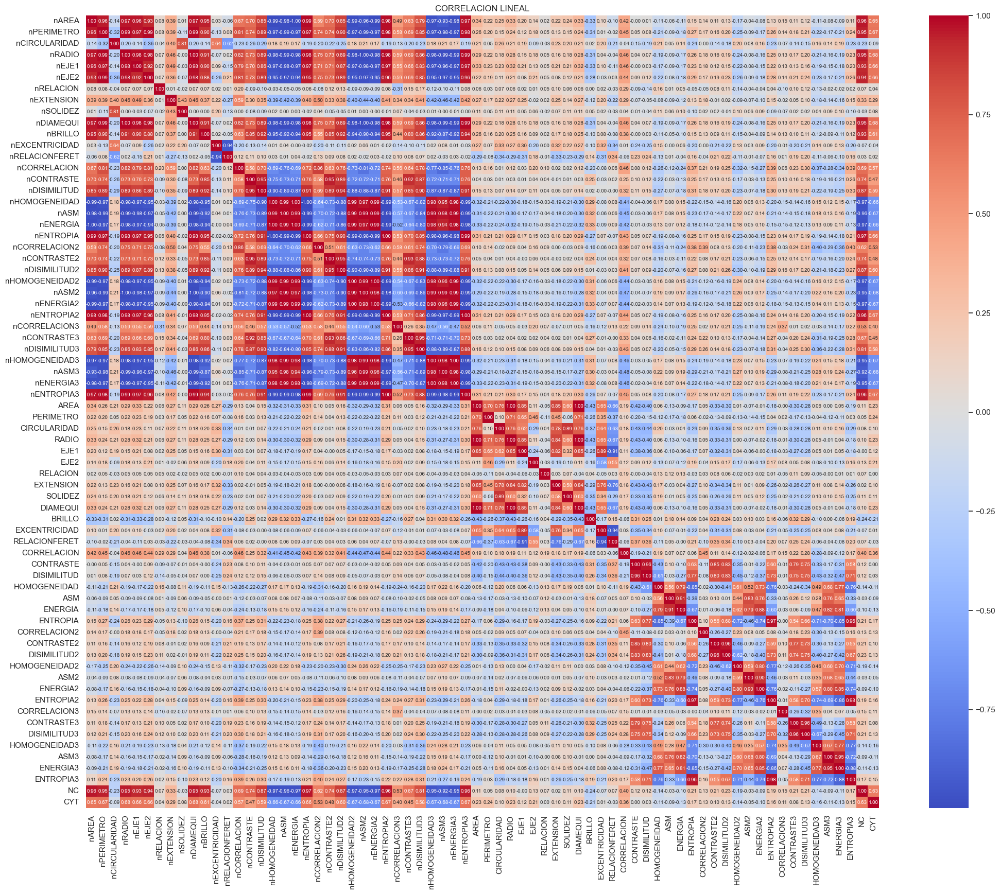

In [49]:
matrizCorrelacion = matrizCaract[matrizCaract.columns.drop(['HERLEV','BIN','HIST'])]
corr = matrizCorrelacion.corr()
plt.figure(figsize=(25,20))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 7},
           xticklabels= matrizCorrelacion.columns, 
           yticklabels= matrizCorrelacion.columns,
           cmap= 'coolwarm')
plt.xticks(rotation = 90)
plt.yticks(rotation = 0)
plt.title('CORRELACION LINEAL')
plt.show()

In [ ]:
'nRADIO', 'NC', 'nCONTRASTE3', 'PERIMETRO', 'CONTRASTE3', 'BRILLO', 'ASM3'

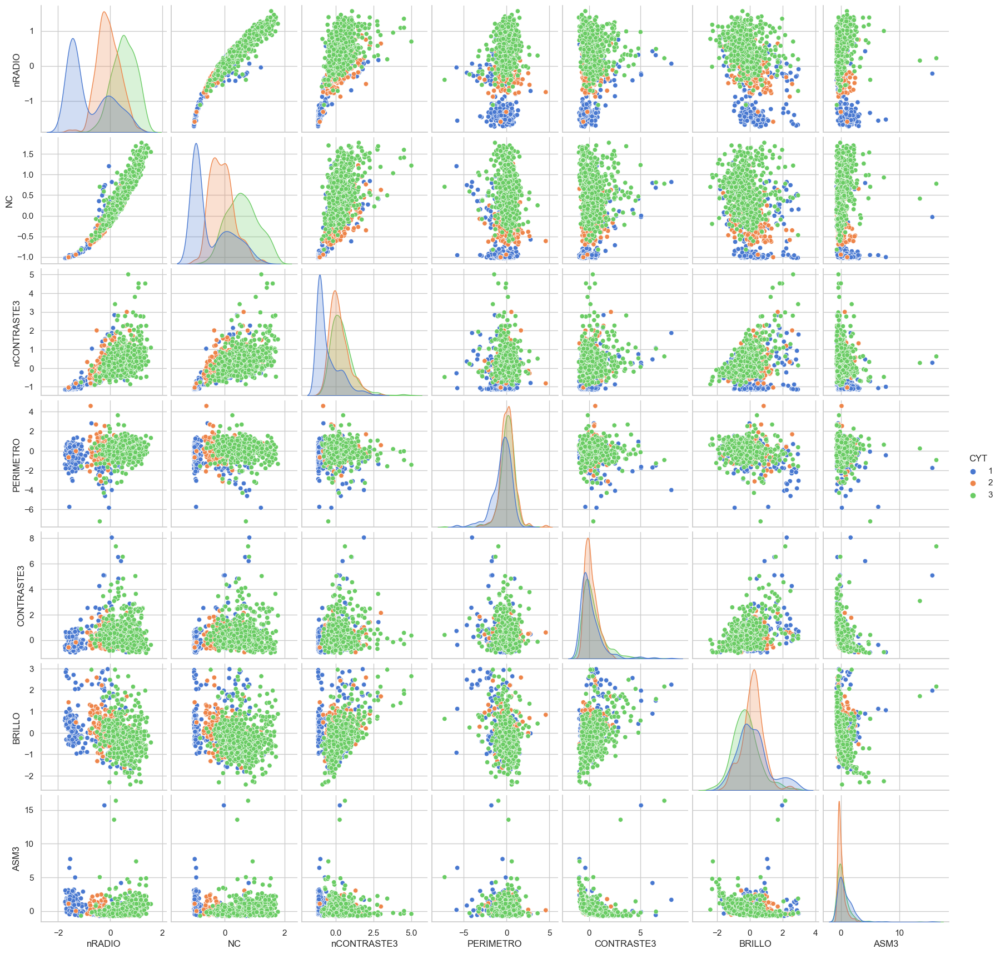

In [50]:
sns.pairplot(data= matrizCorrelacion[['nRADIO', 'NC', 'nCONTRASTE3', 'PERIMETRO', 'CONTRASTE3', 'BRILLO', 'ASM3','CYT']],hue='CYT',palette='muted')


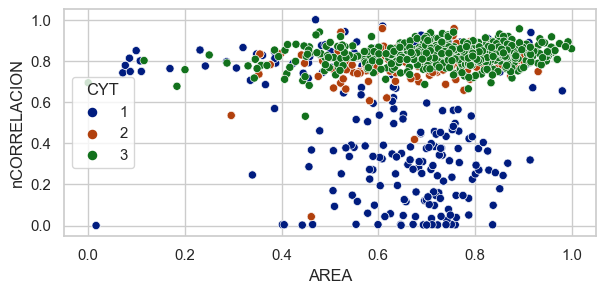

In [28]:
plt.figure(figsize=(7,3),dpi=98)
sns.scatterplot(data=matrizCorrelacion, x='AREA',y='nCORRELACION',hue='CYT',palette='dark');

In [42]:
plt.figure(figsize=(7,3),dpi=98)
fig = px.scatter_3d(matrizCorrelacion, x='nAREA', y='AREA', z='CIRCULARIDAD',color='CYT',)
fig.show()

<Figure size 686x294 with 0 Axes>

# SELECCION DE CARACTERITICAS

### FEATUREWIZ

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (1523, 70)
#### Single_Label Multi_Classification problem ####
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
##############################################

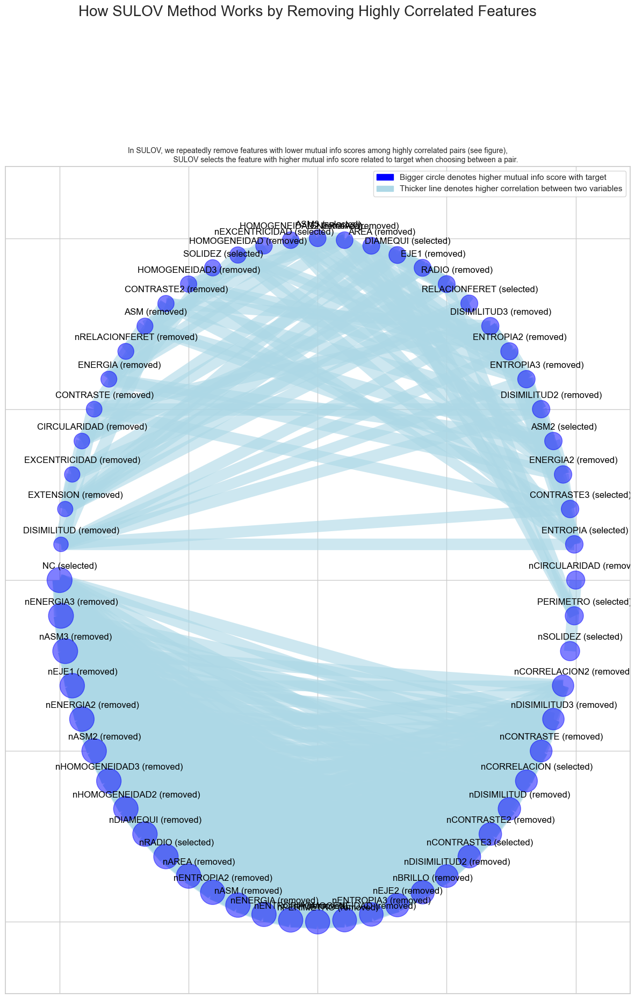

Time taken for SULOV method = 2 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected 23 vars after SULOV = ['BRILLO', 'CORRELACION', 'CORRELACION2', 'CORRELACION3', 'EJE2', 'RELACION', 'nCORRELACION3', 'nEXTENSION', 'nRELACION', 'NC', 'nRADIO', 'nCONTRASTE3', 'nCORRELACION', 'nSOLIDEZ', 'PERIMETRO', 'ENTROPIA', 'CONTRASTE3', 'ASM2', 'RELACIONFERET', 'DIAMEQUI', 'ASM3', 'nEXCENTRICIDAD', 'SOLIDEZ']
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Current number of predictors before recursive XGBoost = 23 
    Taking top 10 features per iteration...
    XGBoost version using 1.7.4 as tree method: hist
Number of booster rounds = 100
        

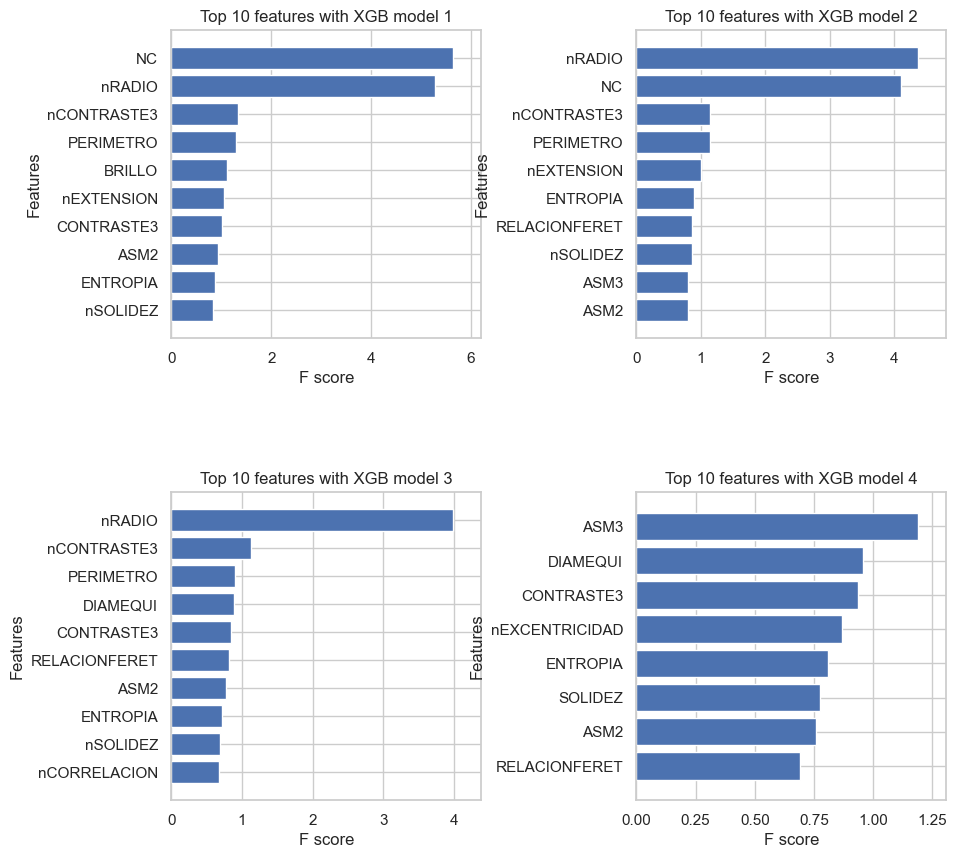

    Completed XGBoost feature selection in 1 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 8 important features:
['NC', 'nRADIO', 'nCONTRASTE3', 'PERIMETRO', 'BRILLO', 'nEXTENSION', 'CONTRASTE3', 'ASM3']
Total Time taken for featurewiz selection = 7 seconds
Output contains a list of 8 important features and a train dataframe


In [51]:
features = featurewiz(matrizCorrelacion, target='CYT', corr_limit=0.70, 
                                verbose=4)

### SELECCION BASADA EN LA VARIANZA

In [ ]:
maaa = matrizCorrelacion[matrizCorrelacion.columns.drop(['CYT'])]
selector = VarianceThreshold(threshold = 0.5)
caractVariance = selector.fit(maaa)
selVar = selector.get_support()
columnas = maaa.columns
columnas = columnas[selVar]
columnas

### PCA

In [ ]:
features[0]

In [57]:
matriz = matrizCorrelacion[matrizCorrelacion.columns.drop(['CYT'])]
#matriz= matrizCorrelacion[features[0]]

pca = PCA()
datos = pca.fit_transform(matriz)
#autovalores
print('variancia explicada por cada componente',pca.explained_variance_)
#proporcion
print('porporcion de la variancia explicada por cada componente',pca.explained_variance_ratio_)
print('suma de todas las proporiones',pca.explained_variance_ratio_.sum())

variancia explicada por cada componente [1.90258221e+01 1.23811566e+01 9.37649786e+00 7.73359067e+00
 3.33022911e+00 2.59075911e+00 2.04787155e+00 1.85859114e+00
 1.51157424e+00 1.26784360e+00 1.24751022e+00 1.12097985e+00
 9.06091254e-01 7.58761895e-01 6.81478603e-01 5.75509622e-01
 3.47203917e-01 2.38806322e-01 2.25687019e-01 1.48184592e-01
 1.33227692e-01 1.15363567e-01 1.04669762e-01 9.57061151e-02
 8.86442463e-02 6.63514412e-02 5.68787482e-02 5.08600163e-02
 4.74873554e-02 4.28588040e-02 4.00943664e-02 3.84922732e-02
 3.09883043e-02 2.97387322e-02 1.93837179e-02 1.84341912e-02
 1.73672269e-02 1.37136000e-02 1.21574670e-02 1.03793225e-02
 8.78827370e-03 6.83386547e-03 4.87871179e-03 4.41669826e-03
 3.87323981e-03 3.37904849e-03 3.21745488e-03 2.78926225e-03
 2.28879625e-03 1.95722537e-03 1.68747839e-03 1.35761115e-03
 1.07339773e-03 8.79426239e-04 7.30921235e-04 6.73311502e-04
 4.52932458e-04 3.92915498e-04 2.41033891e-04 1.89137137e-04
 1.15350860e-04 1.05723258e-04 7.78700099e-05

array([2.77921660e-01, 1.80859023e-01, 1.36968160e-01, 1.12969224e-01,
       4.86466654e-02, 3.78447810e-02, 2.99144950e-02, 2.71495619e-02,
       2.20804767e-02, 1.85201562e-02, 1.82231343e-02, 1.63748288e-02,
       1.32358215e-02, 1.10836927e-02, 9.95476902e-03, 8.40681619e-03,
       5.07181705e-03, 3.48838798e-03, 3.29674642e-03, 2.16462172e-03,
       1.94613726e-03, 1.68518520e-03, 1.52897435e-03, 1.39803695e-03,
       1.29487997e-03, 9.69235524e-04, 8.30862183e-04, 7.42942936e-04,
       6.93676444e-04, 6.26064402e-04, 5.85682595e-04, 5.62279852e-04,
       4.52664852e-04, 4.34411600e-04, 2.83149660e-04, 2.69279351e-04,
       2.53693559e-04, 2.00322826e-04, 1.77591453e-04, 1.51617024e-04,
       1.28375615e-04, 9.98263950e-05, 7.12662859e-05, 6.45173756e-05,
       5.65787502e-05, 4.93597995e-05, 4.69993042e-05, 4.07444362e-05,
       3.34338275e-05, 2.85903715e-05, 2.46500147e-05, 1.98314449e-05,
       1.56797681e-05, 1.28463095e-05, 1.06770074e-05, 9.83546724e-06,
      

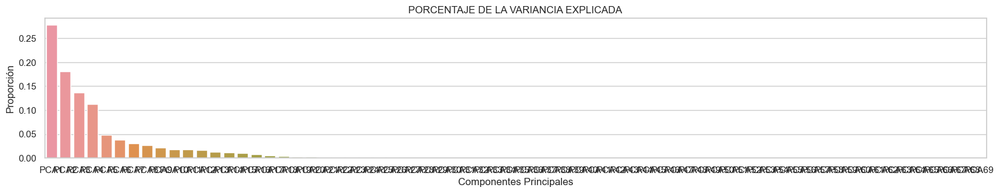

In [58]:
plt.figure(figsize=(20,3))
nomPCA = np.arange(len(pca.feature_names_in_))
nomPCA = ['PCA'+str(e+1)     for i,e in enumerate(nomPCA)]
sns.barplot(x=nomPCA,y= pca.explained_variance_ratio_)
plt.title('PORCENTAJE DE LA VARIANCIA EXPLICADA')
plt.xlabel('Componentes Principales')
plt.ylabel('Proporción')
pca.explained_variance_ratio_

In [62]:
varianzas = pca.explained_variance_ratio_
np.sum(varianzas[0:15])

0.9617464490200771

In [63]:
dataPCA = pd.DataFrame(datos,columns=nomPCA)
dataPCA['CYT'] = matrizCaract['CYT']
#dataPCA['BIN'] = matrizCorrelacion['BIN']
#dataPCA['HIST'] = matrizCaract['HIST']
#dataPCA['HERLEV'] = matrizCaract['HERLEV']

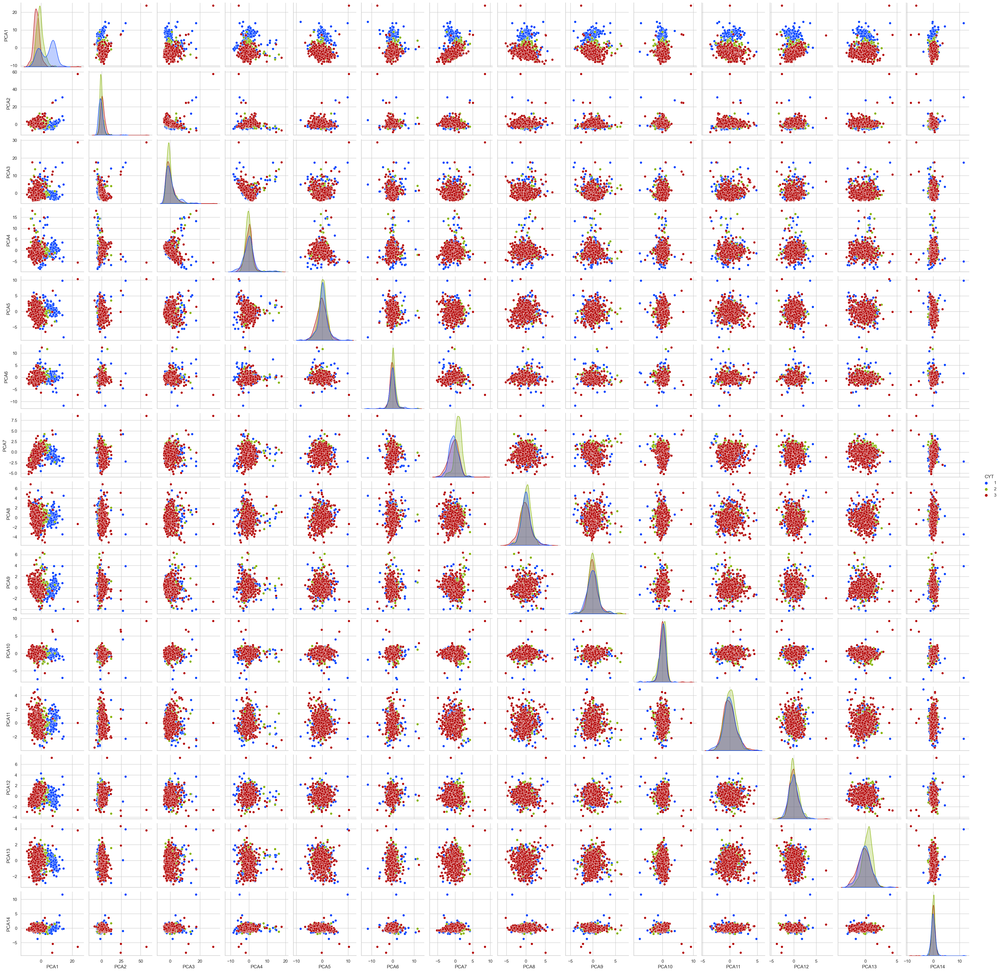

In [64]:
clase = 'CYT'
distPCA = dataPCA[['PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11','PCA12','PCA13','PCA14',clase]]
custom_palette = ["#0040FF", "#86B404", "#B40404"]
sns.pairplot(distPCA,hue=clase,palette=custom_palette)

PCA

In [84]:
dataPCA2 = dataPCA.values
X = dataPCA2[:,0:15]
Y = dataPCA2[:,-1]
x_train,x_test,y_train,y_test= train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)

CARACTERITICAS

In [ ]:
features[0]

In [77]:
feat = features[0].copy()
feat.append('CYT')
matrizCorrelacion2 = matrizCorrelacion[feat].values
X = matrizCorrelacion2[:,0:-2]
Y = matrizCorrelacion2[:,-1]

# matrizCorrelacion2 = matrizCorrelacion[['CORRELACION3', 'EXTENSION', 'RELACION', 'ENERGIA3', 'RADIO', 'SOLIDEZ']]
# matrizCorrelacion2 = matrizCorrelacion2.values
# X = matrizCorrelacion2[:,0:5]
# Y = matrizCorrelacion2[:,-1]

x_train,x_test,y_train,y_test= train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)

In [9]:
x_test.shape

(305, 7)

In [ ]:
features[0]

datos de entrenamiento y test

In [ ]:
#x_train,x_test,y_train,y_test= train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)

# ARBOLES DE DESICION

In [ ]:
# optimizando hiperparámetros
aTest = []
aTrain = []
prof = np.arange(1,40,1)
for p in prof:
    arb = DecisionTreeClassifier(max_depth=p,class_weight='balanced',random_state=0)
    arb.fit(x_train,y_train)
    y_train_predict = arb.predict(x_train)
    y_test_predict = arb.predict(x_test)
    scoreTrain = accuracy_score(y_train_predict,y_train)
    scoreTest = accuracy_score(y_test_predict,y_test)
    aTest.append(scoreTest)
    aTrain.append(scoreTrain)
    #print('PROF:',p ,'SCORETEST: ',scoreTest,'     SCORETRAIN: ',scoreTrain)
plt.figure(figsize=(7,3),dpi=98)
plt.plot(prof,aTrain,'-o',label='entrenamiento')
plt.plot(prof,aTest,'-o',label='validación')
plt.tight_layout()
#plt.ylim(0,1)
plt.xlim(min(prof),max(prof))
plt.title('OPTIMIZACION HIPERPARAMETROS ARBOL')
plt.xlabel('Profundidad')
plt.ylabel('Accuracy')
plt.legend()

porcentaje de aciertos sobre datos de entrenamiento 0.9704433497536946
porcentaje de aciertos sobre datos de test 0.8950819672131147
------------------------------------------------
EVALUACION SOBRE DATOS DE TEST
accuracy: 0.8950819672131147  precision: 0.902809927983539  recall: 0.891561664757541  f1: 0.8923137277764418
------------------------------------------------
INFORME DE CLASIFICACION
              precision    recall  f1-score   support

      clase1       0.91      0.90      0.90        97
      clase2       0.85      1.00      0.92       109
      clase3       0.95      0.78      0.86        99

    accuracy                           0.90       305
   macro avg       0.90      0.89      0.89       305
weighted avg       0.90      0.90      0.89       305



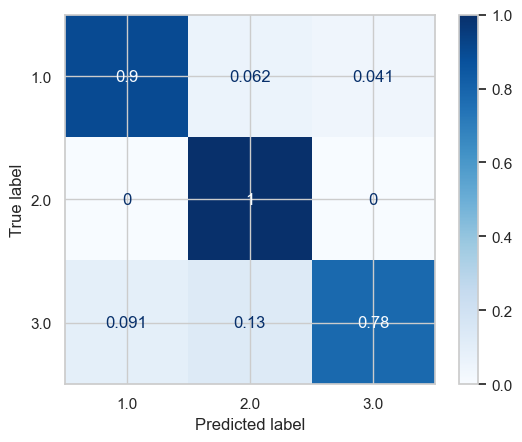

In [112]:
arbol = DecisionTreeClassifier(max_depth=13,class_weight='balanced',random_state=0)
arbol.fit(x_train,y_train)
y_train_predict = arbol.predict(x_train)
y_test_predict = arbol.predict(x_test)
y_test_predict_prob = arbol.predict_proba(x_test)
print('porcentaje de aciertos sobre datos de entrenamiento',accuracy_score(y_train_predict,y_train))
print('porcentaje de aciertos sobre datos de test',accuracy_score(y_test_predict,y_test))
cm = confusion_matrix(y_true=y_test,y_pred=y_test_predict,normalize='true')
matriz  = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=arbol.classes_)
matriz.plot(cmap='Blues')

print('------------------------------------------------')
accuracy = accuracy_score(y_test,y_test_predict)
precision = precision_score(y_test,y_test_predict,average='macro')
recall = recall_score(y_test,y_test_predict,average = 'macro')                            
f1 = f1_score(y_test,y_test_predict,average='macro')
print('EVALUACION SOBRE DATOS DE TEST')
print('accuracy:',accuracy,' precision:',precision,' recall:',recall,' f1:',f1)

# informe de clasificacion
print('------------------------------------------------')
target_names = ['clase1','clase2','clase3']
print('INFORME DE CLASIFICACION')
print(classification_report(y_test, y_test_predict, target_names=target_names))

In [ ]:
# binarizacion de las clases del conjunto de test
#y_test_bin = label_binarize(y_test,classes=np.unique(y_test))
y_test_bin = label_binarize(y_test,classes=arbol.classes_)
# curva ROC para las clases
tfp = {}
tvp = {}
umbral = {}
roc_auc = dict()
n_class = 3
#clases = ['clase1','clase2','clase3','clase4','clase5']
#clases = y_test.unique()
clases = arbol.classes_
#clases = ['normal','lsil','hsil']
for i in range(n_class):    
    tfp[i], tvp[i], umbral[i] = roc_curve(y_test_bin[:,i],  y_test_predict_prob[:,i])
    roc_auc[i] = auc(tfp[i], tvp[i])
    
    # plotting    
    plt.plot(tfp[i], tvp[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)'%(clases[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

Evaluacion con validacion cruzada

In [ ]:
treeTrainScoresMean = []
treeTrainScoresStd = []
treeTestScoresMean = []
treeTestScoresStd = []
profund = np.arange(1,21,1)
for p in profund:
    arbol  = DecisionTreeClassifier(max_depth=p,class_weight='balanced',random_state=0)
    treeScores = cross_validate(arbol, x_train,y_train,cv=5,return_train_score=True)
    treeTrainScoresMean.append(treeScores['train_score'].mean())
    treeTrainScoresStd.append(treeScores['train_score'].std())
    treeTestScoresMean.append(treeScores['test_score'].mean())
    treeTestScoresStd.append(treeScores['test_score'].std())

treeTrainScoresMean = np.array(treeTrainScoresMean)
treeTrainScoresStd = np.array(treeTrainScoresStd)
treeTestScoresMean = np.array(treeTestScoresMean)
treeTestScoresStd = np.array(treeTestScoresStd)
plt.figure(figsize=(7,3),dpi=98)
plt.fill_between(profund, treeTrainScoresMean - treeTrainScoresStd,
                 treeTrainScoresMean + treeTrainScoresStd, alpha=0.1,
                 color="r")
plt.fill_between(profund, treeTestScoresMean - treeTestScoresStd,
                 treeTestScoresMean + treeTestScoresStd, alpha=0.1, color="g")

plt.plot(profund, treeTrainScoresMean, 'o-', color="r",
         label="Training score")
plt.plot(profund, treeTestScoresMean, 'o-', color="g",
         label="Test score")

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Profundidad Arbol de Decision')
plt.show()

In [110]:
arbol = DecisionTreeClassifier(max_depth=16,class_weight='balanced',random_state=0)
scores = cross_val_score(arbol,x_train,y_train,cv=5,scoring='accuracy')
print('RESULTADOS')
print('puntaje por iteracion: ',scores, ' media:',scores.mean())

RESULTADOS
puntaje por iteracion:  [0.81147541 0.80327869 0.82786885 0.81069959 0.84773663]  media: 0.8202118329622883


# MAQUINAS DE SOPORTE VECTORIAL

In [66]:
# optimizando hiperparámetros
aTest = []
aTrain = []
valor = np.arange(0.1,21,0.1)
for p in valor:
    msv = SVC(kernel='poly',C=p,class_weight='balanced',random_state=0,probability=True).fit(x_train,y_train);
    y_train_predict = msv.predict(x_train);
    y_test_predict = msv.predict(x_test);
    scoreTrain = accuracy_score(y_train_predict,y_train)
    scoreTest = accuracy_score(y_test_predict,y_test)
    aTest.append(scoreTest)
    aTrain.append(scoreTrain)
    #print('PROF:',p ,'SCORETEST: ',scoreTest,'     SCORETRAIN: ',scoreTrain)

plt.figure(figsize=(7,3),dpi=98)
plt.plot(valor,aTrain,'-o',label='train')
plt.plot(valor,aTest,'-o',label = 'test')
plt.tight_layout()
#plt.ylim(0.5,1)
plt.xlim(min(valor),max(valor))
plt.xlabel('Parámetro C ')
plt.ylabel('Accuracy')
plt.legend()
plt.title('OPTIMIZACION HIPERPARAMETROS SVM')

KeyboardInterrupt: 

In [ ]:
msv = SVC(kernel='poly',C=13,class_weight='balanced',probability=True,random_state=0).fit(x_train,y_train)
y_train_predict = msv.predict(x_train)
y_test_predict = msv.predict(x_test)
y_test_predict_prob = msv.predict_proba(x_test)
print('porcentaje de aciertos sobre datos de entrenamiento',accuracy_score(y_train_predict,y_train))
print('porcentaje de aciertos sobre datos de test',accuracy_score(y_test_predict,y_test))
cm = confusion_matrix(y_true=y_test,y_pred=y_test_predict,normalize='true')
matriz  = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=msv.classes_)
matriz.plot(cmap='Blues')

print('------------------------------------------------')
accuracy = accuracy_score(y_test,y_test_predict)
precision = precision_score(y_test,y_test_predict,average='macro')
recall = recall_score(y_test,y_test_predict,average='macro')                            
f1 = f1_score(y_test,y_test_predict,average='macro')
print('EVALUACION SOBRE DATOS DE TEST')
print('accuracy:',accuracy,' precision:',precision,' recall:',recall,' f1:',f1)

# informe de clasificacion
print('------------------------------------------------')
target_names = ['clase1','clase2','clase3']
print('INFORME DE CLASIFICACION')
print(classification_report(y_test, y_test_predict, target_names=target_names))

In [ ]:
print('Area bajo la curva ROC: ', roc_auc_score(y_true=y_test,y_score=y_test_predict_prob,multi_class='ovr'))
# binarizacion de las clases del conjunto de test
#y_test_bin = label_binarize(y_test,classes=np.unique(y_test))
y_test_bin = label_binarize(y_test,classes=msv.classes_)
# curva ROC para las clases
tfp = {}
tvp = {}
umbral = {}
roc_auc = dict()
n_class = 3
#clases = ['clase1','clase2','clase3','clase4','clase5']
#clases = y_test.unique()
clases = msv.classes_
#clases = ['normal','lsil','hsil']
for i in range(n_class):    
    tfp[i], tvp[i], umbral[i] = roc_curve(y_test_bin[:,i],  y_test_predict_prob[:,i])
    roc_auc[i] = auc(tfp[i], tvp[i])
    
    # plotting    
    plt.plot(tfp[i], tvp[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)'%(clases[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

In [ ]:
msvTrainScoresMean = []
msvTrainScoresStd = []
msvTestScoresMean = []
msvTestScoresStd = []
valor = np.arange(0.1,5,0.1)
for p in valor:

    msv = SVC(kernel='poly',C=p,class_weight='balanced',probability=True,random_state=0)
    msvScores = cross_validate(msv, x_train,y_train,cv=5,return_train_score=True)
    msvTrainScoresMean.append(msvScores['train_score'].mean())
    msvTrainScoresStd.append(msvScores['train_score'].std())
    msvTestScoresMean.append(msvScores['test_score'].mean())
    msvTestScoresStd.append(msvScores['test_score'].std())

msvTrainScoresMean = np.array(msvTrainScoresMean)
msvTrainScoresStd = np.array(msvTrainScoresStd)
msvTestScoresMean = np.array(msvTestScoresMean)
msvTestScoresStd = np.array(msvTestScoresStd)

plt.fill_between(valor, msvTrainScoresMean - msvTrainScoresStd,
                 msvTrainScoresMean + msvTrainScoresStd, alpha=0.1,
                 color="r")
plt.fill_between(valor, msvTestScoresMean - msvTestScoresStd,
                 msvTestScoresMean + msvTestScoresStd, alpha=0.1, color="g")

plt.plot(valor, msvTrainScoresMean, 'o-', color="r",
         label="Training score")
plt.plot(valor, msvTestScoresMean, 'o-', color="g",
         label="Test score")

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Parámetro C MSV')
plt.show()

In [109]:
msv = SVC(kernel='poly',C=20,class_weight='balanced',probability=True,random_state=0)
scores = cross_val_score(msv,x_train,y_train,cv=5,scoring='accuracy')
print('RESULTADOS')
print('puntaje por iteracion: ',scores, ' media:',scores.mean())

RESULTADOS
puntaje por iteracion:  [0.77868852 0.81147541 0.82786885 0.77777778 0.75720165]  media: 0.7906024421507117


# KNN K_VECINOS

Text(29.75, 0.5, 'Accuracy')

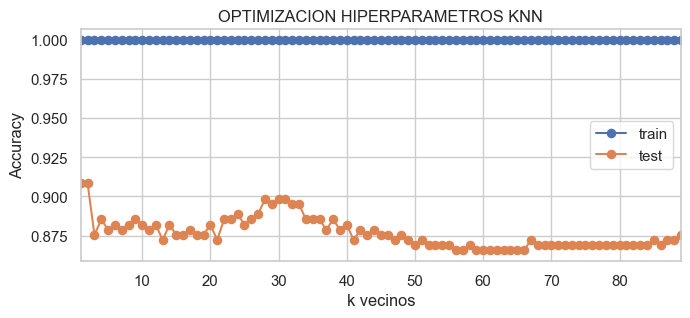

In [79]:
# optimizando hiperparámetros
aTest = []
aTrain = []
valor = np.arange(1,90,1)
for p in valor:
    knn = KNeighborsClassifier(n_neighbors=p,weights='distance').fit(x_train,y_train)
    y_train_predict = knn.predict(x_train)
    y_test_predict = knn.predict(x_test)
    scoreTrain = accuracy_score(y_train_predict,y_train)
    scoreTest = accuracy_score(y_test_predict,y_test)
    aTest.append(scoreTest)
    aTrain.append(scoreTrain)
    #print('PROF:',p ,'SCORETEST: ',scoreTest,'     SCORETRAIN: ',scoreTrain)
plt.figure(figsize=(7,3),dpi=98)
plt.plot(valor,aTrain,'-o',label='train')
plt.plot(valor,aTest,'-o',label='test')
plt.tight_layout()
plt.legend()
#plt.ylim(0,1)
plt.xlim(min(valor),max(valor))
plt.title('OPTIMIZACION HIPERPARAMETROS KNN')
plt.xlabel('k vecinos')
plt.ylabel('Accuracy')

porcentaje de aciertos sobre datos de entrenamiento 1.0
porcentaje de aciertos sobre datos de test 0.9081967213114754
------------------------------------------------
EVALUACION SOBRE DATOS DE TEST
accuracy: 0.9081967213114754  precision: 0.9215464499493976  recall: 0.9053073692248951  f1: 0.9071395131086143
------------------------------------------------
INFORME DE CLASIFICACION
              precision    recall  f1-score   support

      clase1       0.96      0.94      0.95        97
      clase2       0.83      1.00      0.91       109
      clase3       0.97      0.78      0.87        99

    accuracy                           0.91       305
   macro avg       0.92      0.91      0.91       305
weighted avg       0.92      0.91      0.91       305



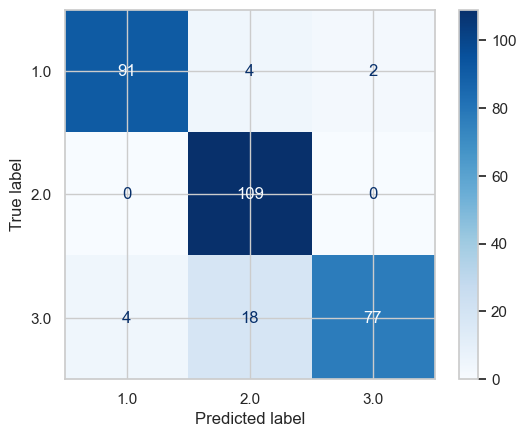

In [85]:
#knn = KNeighborsClassifier(n_neighbors=2,weights='distance').fit(x_train,y_train)
y_train_predict = knn.predict(x_train)
y_test_predict = knn.predict(x_test)
y_test_predict_prob = knn.predict_proba(x_test)
print('porcentaje de aciertos sobre datos de entrenamiento',accuracy_score(y_train_predict,y_train))
print('porcentaje de aciertos sobre datos de test',accuracy_score(y_test_predict,y_test))
cm = confusion_matrix(y_true=y_test,y_pred=y_test_predict)
matriz  = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn.classes_)
matriz.plot(cmap='Blues')

print('------------------------------------------------')
accuracy = accuracy_score(y_test,y_test_predict,)
precision = precision_score(y_test,y_test_predict,average='macro')
recall = recall_score(y_test,y_test_predict,average='macro')                            
f1 = f1_score(y_test,y_test_predict,average='macro')
print('EVALUACION SOBRE DATOS DE TEST')
print('accuracy:',accuracy,' precision:',precision,' recall:',recall,' f1:',f1)

# informe de clasificacion
print('------------------------------------------------')
target_names = ['clase1','clase2','clase3']
print('INFORME DE CLASIFICACION')
print(classification_report(y_test, y_test_predict, target_names=target_names))

Area bajo la curva ROC:  0.9938033455699355


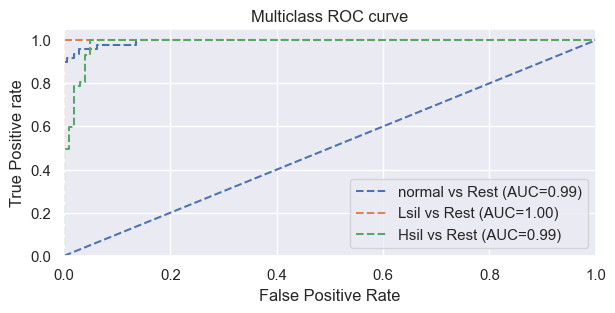

In [22]:
print('Area bajo la curva ROC: ', roc_auc_score(y_true=y_test,y_score=y_test_predict_prob,multi_class='ovr'))
# binarizacion de las clases del conjunto de test
#y_test_bin = label_binarize(y_test,classes=np.unique(y_test))
y_test_bin = label_binarize(y_test,classes=knn.classes_)
# curva ROC para las clases
tfp = {}
tvp = {}
umbral = {}
roc_auc = dict()
n_class = 3
#clases = ['clase1','clase2','clase3','clase4','clase5']
#clases = y_test.unique()
clases = knn.classes_
clases = ['normal','Lsil','Hsil']
plt.figure(figsize=(7,3),dpi=98) 
for i in range(n_class):    
    tfp[i], tvp[i], umbral[i] = roc_curve(y_test_bin[:,i],  y_test_predict_prob[:,i])
    roc_auc[i] = auc(tfp[i], tvp[i])
    
    # plotting    
    plt.plot(tfp[i], tvp[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)'%(clases[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

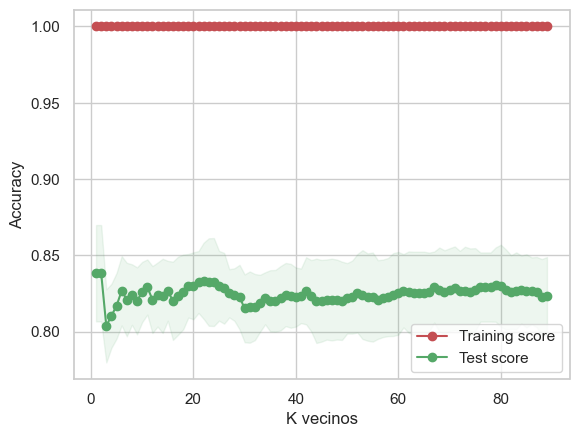

In [69]:
knnTrainScoresMean = []
knnTrainScoresStd = []
knnTestScoresMean = []
knnTestScoresStd = []
valor = np.arange(1,90,1)
for p in valor:
    knn = KNeighborsClassifier(n_neighbors=p,weights='distance').fit(x_train,y_train)
    knnScores = cross_validate(knn, x_train,y_train,cv=5,return_train_score=True)
    knnTrainScoresMean.append(knnScores['train_score'].mean())
    knnTrainScoresStd.append(knnScores['train_score'].std())
    knnTestScoresMean.append(knnScores['test_score'].mean())
    knnTestScoresStd.append(knnScores['test_score'].std())

knnTrainScoresMean = np.array(knnTrainScoresMean)
knnTrainScoresStd = np.array(knnTrainScoresStd)
knnTestScoresMean = np.array(knnTestScoresMean)
knnTestScoresStd = np.array(knnTestScoresStd)

plt.fill_between(valor, knnTrainScoresMean - knnTrainScoresStd,
                 knnTrainScoresMean + knnTrainScoresStd, alpha=0.1,
                 color="r")
plt.fill_between(valor, knnTestScoresMean - knnTestScoresStd,
                 knnTestScoresMean + knnTestScoresStd, alpha=0.1, color="g")

plt.plot(valor, knnTrainScoresMean, 'o-', color="r", label="Training score")
plt.plot(valor, knnTestScoresMean, 'o-', color="g",  label="Test score")

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('K vecinos')
plt.show()

In [102]:
knn = KNeighborsClassifier(n_neighbors=2,weights='distance')
scores = cross_val_score(knn,x_train,y_train,cv=5,scoring='accuracy')
print('RESULTADOS')
print('puntaje por iteracion: ',scores, ' media:',scores.mean())

RESULTADOS
puntaje por iteracion:  [0.79098361 0.87295082 0.83606557 0.81893004 0.87242798]  media: 0.8382716049382715


# REDES NEURONALES

In [ ]:
# optimizando hiperparámetros
aTest = []
aTrain = []
valor = np.arange(5,60,1)
for p in valor:
    red = MLPClassifier(random_state = 0,max_iter=100,hidden_layer_sizes=(100,80,p),activation='relu',solver='adam').fit(x_train,y_train)
    y_train_predict = red.predict(x_train);
    y_test_predict = red.predict(x_test);
    scoreTrain = accuracy_score(y_train_predict,y_train)
    scoreTest = accuracy_score(y_test_predict,y_test)
    aTest.append(scoreTest)
    aTrain.append(scoreTrain)
    #print('PROF:',p ,'SCORETEST: ',scoreTest,'     SCORETRAIN: ',scoreTrain)

plt.figure(figsize=(7,3),dpi=98)
plt.plot(valor,aTrain,'-o',label='train')
plt.plot(valor,aTest,'-o',label='test')
plt.tight_layout()
#plt.ylim(0.5,1)
plt.xlim(min(valor),max(valor))
plt.xlabel('Neuronas capa oulta 2 ')
plt.ylabel('Accuracy')

porcentaje de aciertos sobre datos de entrenamiento 0.8932676518883416
porcentaje de aciertos sobre datos de test 0.8163934426229508
------------------------------------------------
EVALUACION SOBRE DATOS DE TEST
accuracy: 0.8163934426229508  precision: 0.8180521800464606  recall: 0.8150711694644354  f1: 0.8159315526215504
------------------------------------------------
INFORME DE CLASIFICACION
              precision    recall  f1-score   support

      clase1       0.85      0.80      0.83        97
      clase2       0.88      0.85      0.87       109
      clase3       0.73      0.79      0.76        99

    accuracy                           0.82       305
   macro avg       0.82      0.82      0.82       305
weighted avg       0.82      0.82      0.82       305



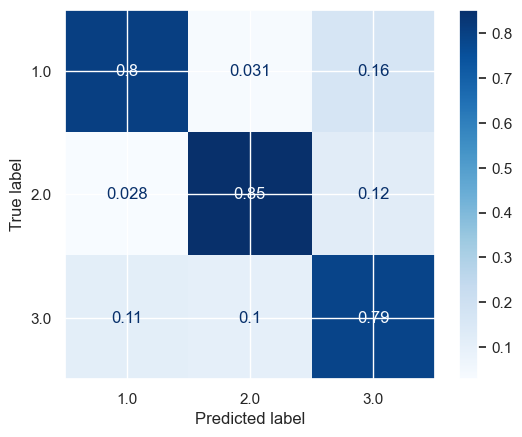

In [17]:

red = MLPClassifier(random_state = 0,max_iter=100,hidden_layer_sizes=(100,80,29),activation='relu',solver='adam',).fit(x_train,y_train)

y_train_predict = red.predict(x_train)
y_test_predict = red.predict(x_test)
y_test_predict_prob = red.predict_proba(x_test)
print('porcentaje de aciertos sobre datos de entrenamiento',accuracy_score(y_train_predict,y_train))
print('porcentaje de aciertos sobre datos de test',accuracy_score(y_test_predict,y_test))
cm = confusion_matrix(y_true=y_test,y_pred=y_test_predict,normalize='true')
matriz  = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=red.classes_)
matriz.plot(cmap='Blues')

print('------------------------------------------------')
accuracy = accuracy_score(y_test,y_test_predict)
precision = precision_score(y_test,y_test_predict,average='macro')
recall = recall_score(y_test,y_test_predict,average='macro')                            
f1 = f1_score(y_test,y_test_predict,average='macro')
print('EVALUACION SOBRE DATOS DE TEST')
print('accuracy:',accuracy,' precision:',precision,' recall:',recall,' f1:',f1)

# informe de clasificacion
print('------------------------------------------------')
target_names = ['clase1','clase2','clase3']
print('INFORME DE CLASIFICACION')
print(classification_report(y_test, y_test_predict, target_names=target_names))

In [ ]:
print('Area bajo la curva ROC: ', roc_auc_score(y_true=y_test,y_score=y_test_predict_prob,multi_class='ovr'))
# binarizacion de las clases del conjunto de test
#y_test_bin = label_binarize(y_test,classes=np.unique(y_test))
y_test_bin = label_binarize(y_test,classes=red.classes_)
# curva ROC para las clases
tfp = {}
tvp = {}
umbral = {}
roc_auc = dict()
n_class = 3
#clases = ['clase1','clase2','clase3','clase4','clase5']
#clases = y_test.unique()
clases = red.classes_
#clases = ['normal','lsil','hsil']
for i in range(n_class):    
    tfp[i], tvp[i], umbral[i] = roc_curve(y_test_bin[:,i],  y_test_predict_prob[:,i])
    roc_auc[i] = auc(tfp[i], tvp[i])
    
    # plotting    
    plt.plot(tfp[i], tvp[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)'%(clases[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

In [ ]:
redTrainScoresMean = []
redTrainScoresStd = []
redTestScoresMean = []
redTestScoresStd = []
valor = np.arange(5,60,1)
for p in valor:
    red = MLPClassifier(random_state = 0,max_iter=100,hidden_layer_sizes=(100,80,p),activation='relu',solver='adam')
    redScores = cross_validate(red, x_train,y_train,cv=5,return_train_score=True)
    redTrainScoresMean.append(redScores['train_score'].mean())
    redTrainScoresStd.append(redScores['train_score'].std())
    redTestScoresMean.append(redScores['test_score'].mean())
    redTestScoresStd.append(redScores['test_score'].std())

redTrainScoresMean = np.array(redTrainScoresMean)
redTrainScoresStd = np.array(redTrainScoresStd)
redTestScoresMean = np.array(redTestScoresMean)
redTestScoresStd = np.array(redTestScoresStd)

plt.fill_between(valor,redTrainScoresMean - redTrainScoresStd,
                 redTrainScoresMean + redTrainScoresStd, alpha=0.1,
                 color="r")
plt.fill_between(valor, redTestScoresMean - redTestScoresStd,
                 redTestScoresMean + redTestScoresStd, alpha=0.1, color="g")

plt.plot(valor, redTrainScoresMean, 'o-', color="r",
         label="Training score")
plt.plot(valor, redTestScoresMean, 'o-', color="g",
         label="Test score")

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Parámetro')
plt.show()

In [103]:
red = MLPClassifier(random_state = 0,max_iter=100,hidden_layer_sizes=(100,80,27),activation='relu',solver='adam')
scores = cross_val_score(red,x_train,y_train,cv=5,scoring='accuracy')
print('RESULTADOS')
print('puntaje por iteracion: ',scores, ' media:',scores.mean())

RESULTADOS
puntaje por iteracion:  [0.83606557 0.87295082 0.88114754 0.8600823  0.81069959]  media: 0.852189165486069
